In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [2]:
#read the data set

df=pd.read_csv('zomato.csv')
zomato_df=df.copy()

In [3]:
zomato_df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [4]:
zomato_df.tail()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
51712,https://www.zomato.com/bangalore/best-brews-fo...,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6 /5,27,080 40301477,Whitefield,Bar,NaN,Continental,"1,500","[('Rated 5.0', ""RATED\n Food and service are ...",[],Pubs and bars,Whitefield
51713,https://www.zomato.com/bangalore/vinod-bar-and...,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,NaN,0,+91 8197675843,Whitefield,Bar,NaN,Finger Food,600,[],[],Pubs and bars,Whitefield
51714,https://www.zomato.com/bangalore/plunge-sherat...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,NaN,0,NaN,Whitefield,Bar,NaN,Finger Food,"2,000",[],[],Pubs and bars,Whitefield
51715,https://www.zomato.com/bangalore/chime-sherato...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,"2,500","[('Rated 4.0', 'RATED\n Nice and friendly pla...",[],Pubs and bars,Whitefield
51716,https://www.zomato.com/bangalore/the-nest-the-...,"ITPL Main Road, KIADB Export Promotion Industr...",The Nest - The Den Bengaluru,No,No,3.4 /5,13,+91 8071117272,"ITPL Main Road, Whitefield","Bar, Casual Dining",NaN,"Finger Food, North Indian, Continental","1,500","[('Rated 5.0', 'RATED\n Great ambience , look...",[],Pubs and bars,Whitefield


In [5]:
num_rows=zomato_df.shape[0]
print("number of rows {}".format(num_rows))

number of rows 51717


In [6]:
print("information about dataset")
print("----------------------------------------------------------------------")
print(zomato_df.info())
print("-----------------------------NULL VAL-----------------------------------")
print(zomato_df.isnull().sum())
print("----------------------NAME OF COLS-----------------------------------------")
cols=zomato_df.columns
for i in range(len(cols)):
    print(str(i)+". "+cols[i])

information about dataset
----------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
url                            51717 non-null object
address                        51717 non-null object
name                           51717 non-null object
online_order                   51717 non-null object
book_table                     51717 non-null object
rate                           43942 non-null object
votes                          51717 non-null int64
phone                          50509 non-null object
location                       51696 non-null object
rest_type                      51490 non-null object
dish_liked                     23639 non-null object
cuisines                       51672 non-null object
approx_cost(for two people)    51371 non-null object
reviews_list                   51717 non-null object
menu_item                      51717 non-null object


## PART:1

### Preparing the Data

Here we will do some data preprocessing and prepare the data according to our convinience for EDA.
For example:
 - Dropping the non required columns
 - Renaming a few columns for our comfort
 - Changing the data type of certain columns( from object to int/float)

#### Dropping non required columns

We can remove the following columns as they don't have any buisness significance in the EDA
 - url
 - phone
 - address
 - dishes_liked (as almost half of the column has null values
 - menu_item
 



In [7]:
zomato_df.drop(['url','phone','address','dish_liked','menu_item'],axis=1,inplace=True)


 we will rename a few columns for our convinience

In [8]:
zomato_df.rename(columns={'approx_cost(for two people)':'cost_for_two','reviews_list':'last_review','listed_in(type)':'type',
                         'listed_in(city)':'city'},inplace=True)

In [9]:
zomato_df.head()

,name,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_for_two,last_review,type,city
0,Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet,Banashankari
2,San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet,Banashankari
3,Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet,Banashankari
4,Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet,Banashankari


In [10]:
# fetch the rate and convert it into float
#have values like NEW, nan, -, we have to drop it

zomato_df.drop(zomato_df.index[zomato_df['rate']=="NEW"],inplace=True)
zomato_df.drop(zomato_df.index[zomato_df['rate']=="-"],inplace=True)
zomato_df.loc[:,'rate']=zomato_df['rate'].dropna().apply(lambda x: x[:3])
zomato_df.rate=zomato_df['rate'].dropna().astype('float')


In [11]:
#rate has null values
#for the time bieng we will fill it with the mean value of the column
mean_rate=zomato_df['rate'].dropna().mean()
#round off to 1 decimal place
mean_rate=round(mean_rate,1)
print('the mean is {}'.format(mean_rate))
zomato_df['rate'].fillna(value=mean_rate,inplace=True)

the mean is 3.7


In [12]:
#converting cost_for_two object->int64

zomato_df.loc[:,'cost_for_two']=zomato_df['cost_for_two'].dropna().apply(lambda x: x.replace(',',''))
zomato_df['cost_for_two']=zomato_df['cost_for_two'].dropna().astype('float')
    

In [73]:
zomato_df.isnull().sum()

name              0
online_order      0
book_table        0
rate              0
votes             0
location         21
rest_type       225
cuisines         45
cost_for_two    341
last_review       0
type              0
city              0
dtype: int64

In [77]:
zomato_df.cost_for_two=zomato_df.groupby('location')['cost_for_two'].apply(lambda x: x.fillna(x.mean()))
zomato_df.cost_for_two=zomato_df.cost_for_two.fillna(zomato_df.cost_for_two.mean())

In [78]:
zomato_df.isnull().sum()

name              0
online_order      0
book_table        0
rate              0
votes             0
location         21
rest_type       225
cuisines         45
cost_for_two      0
last_review       0
type              0
city              0
dtype: int64

We see that Null values in cost_for_two becomes 0

## PART 2: 

### Let's plot some basic visualizations

Here is our course of action:
 - first we will check count of restaurants according to the type 
 - according to rest_type
 - how many restaurants are their in each city
 - online order
 - top 10 restaurant chain
 - top 10 restaurants according to votes they recieved 
 

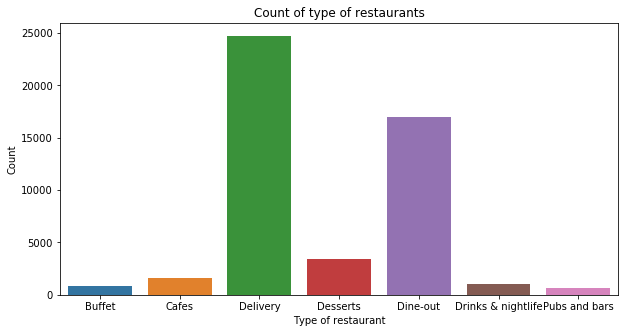

In [14]:
plt.figure(figsize=(10,5))
ax=sns.countplot(x='type',data=zomato_df)
plt.xlabel("Type of restaurant")
plt.ylabel("Count")
plt.title("Count of type of restaurants")
plt.show(ax)



In [15]:
#count of each rest_type
rest_type={}
for types in zomato_df.rest_type.dropna():
    if(', ' in types):
        lis=types.split(', ')
        for typ in lis:
            if typ not in rest_type:
                rest_type[typ]=1
            else:
                rest_type[typ]+=1
    else:
        if types not in rest_type:
            rest_type[types]=1
        else:
            rest_type[types]+=1

print("rest_types : ")
print(rest_type)

rest_types : 
{'Casual Dining': 12707, 'Cafe': 4910, 'Quick Bites': 19485, 'Delivery': 4350, 'Mess': 260, 'Dessert Parlor': 3095, 'Bakery': 1920, 'Pub': 912, 'Takeaway': 1966, 'Fine Dining': 405, 'Beverage Shop': 1404, 'Sweet Shop': 739, 'Bar': 2379, 'Confectionery': 47, 'Kiosk': 190, 'Food Truck': 82, 'Microbrewery': 375, 'Lounge': 540, 'Food Court': 736, 'Dhaba': 33, 'Club': 41, 'Irani Cafee': 15, 'Bhojanalya': 3, 'Pop Up': 2, 'Meat Shop': 4}


In [16]:
rest_type_df=pd.DataFrame(list(rest_type.items()),columns=['rest_type','count'])
rest_type_df.sort_values(by='count',inplace=True)

Text(0.5, 1.0, 'Count of top 10 rest_type')

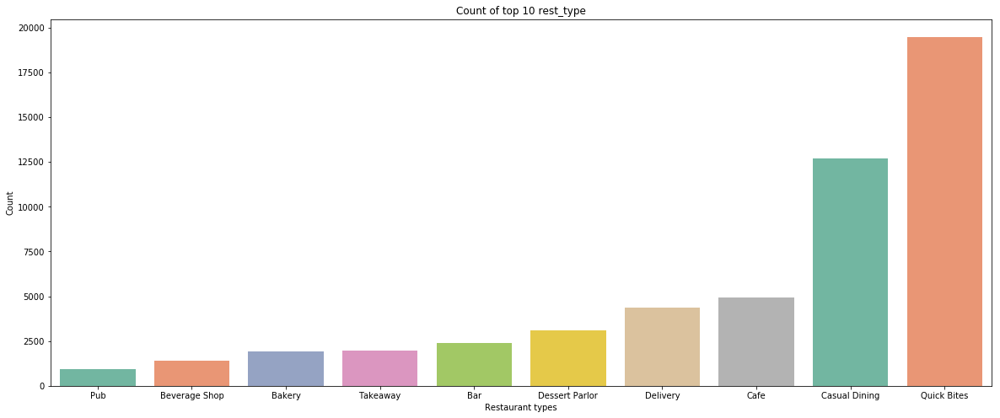

In [17]:
rcParams['figure.figsize']=(20,8)
sns.barplot(x='rest_type',y='count',data=rest_type_df.tail(10),palette="Set2")
plt.xlabel("Restaurant types")
plt.ylabel('Count')
plt.title("Count of top 10 rest_type")

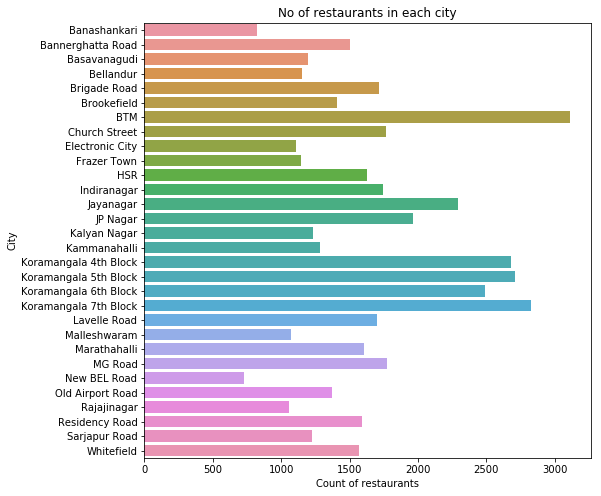

In [44]:
#count of restaurants in each city
plt.figure(figsize=(8,8))
ax=sns.countplot(y='city',data=zomato_df)
plt.xlabel("Count of restaurants")
plt.ylabel("City")
plt.title("No of restaurants in each city")
plt.show(ax)

['Yes' 'No']
[29342, 20098]


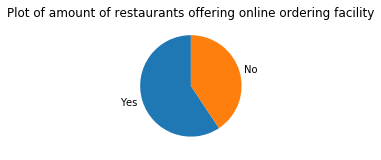

In [53]:
online_order_facility=zomato_df['online_order'].unique() #fetching the unique values from the column
counts=[0]*len(online_order_facility)
for i in zomato_df['online_order']:
    if(i==online_order_facility[0]):
        counts[0]+=1
    elif(i==online_order_facility[1]):
        counts[1]+=1
print(online_order_facility)
print(counts)

plt.subplot(1,2,1)
ax=plt.pie(counts,labels=online_order_facility,startangle=90)
plt.title("Plot of amount of restaurants offering online ordering facility")
plt.show(ax)




Text(0.5, 1.0, 'Online order facility in different cities')

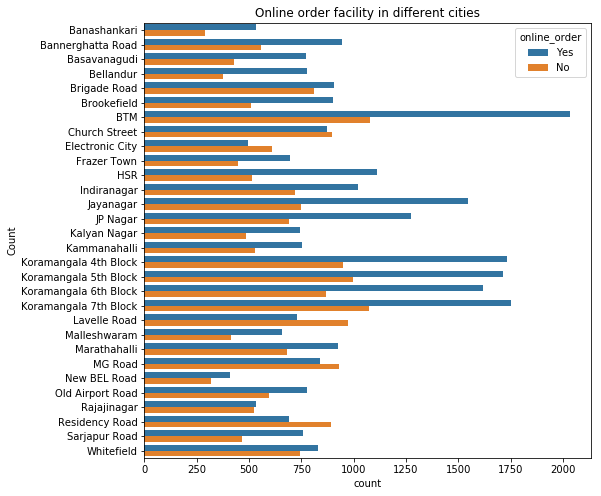

In [54]:
plt.figure(figsize=(8,8))
ax=sns.countplot(y='city',hue='online_order',data=zomato_df)
plt.ylabel("City")
plt.ylabel("Count")
plt.title("Online order facility in different cities")

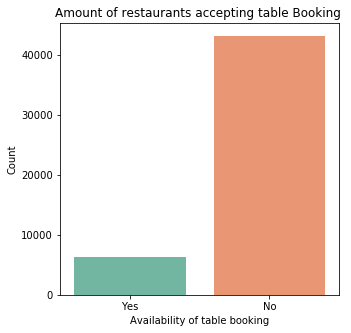

In [55]:
#simillarly we will do for table booking

rcParams['figure.figsize']=(5,5)
ax1=sns.countplot(x='book_table',data=zomato_df,palette='Set2')
plt.xlabel("Availability of table booking")
plt.ylabel('Count')
plt.title('Amount of restaurants accepting table Booking ')
plt.show(ax1)

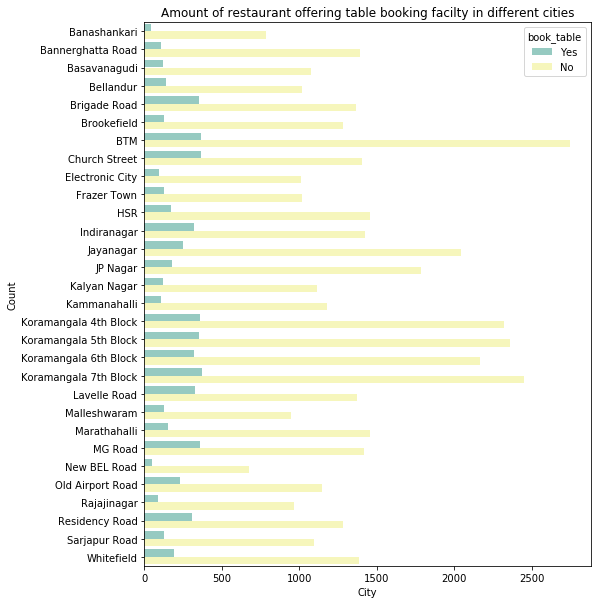

In [58]:
rcParams['figure.figsize']=(8,10)
ax2=sns.countplot(y='city',hue='book_table',data=zomato_df,palette='Set3')
plt.xlabel('City')
plt.ylabel('Count')
plt.title("Amount of restaurant offering table booking facilty in different cities")
plt.show(ax2)

In [22]:
#top 10 chains
unique_rest=zomato_df['name'].unique().tolist()
rest_count=[0]*len(unique_rest)

for name in zomato_df['name']:
    idx=unique_rest.index(name)
    rest_count[idx]+=1
    



In [23]:
rest_dict={"Rest Name":unique_rest,"Count":rest_count}
rest_chain_df=pd.DataFrame(rest_dict)
rest_chain_df.head()

,Rest Name,Count
0,Jalsa,11
1,Spice Elephant,4
2,San Churro Cafe,11
3,Addhuri Udupi Bhojana,2
4,Grand Village,4


In [24]:
rest_chain_df.sort_values(by='Count',ascending=False,inplace=True)

In [25]:
rest_chain_df.head()

,Rest Name,Count
21,Cafe Coffee Day,93
7,Onesta,85
106,Just Bake,72
56,Five Star Chicken,70
37,Empire Restaurant,69


In [26]:
fig=px.bar(rest_chain_df.head(10),x='Rest Name',y='Count',title="Top 10 Chains")
fig.show()

__this count plot can be done easily through sns.countplot()__



In [27]:
#cuisines available
cuisines=[]
for cuisine in zomato_df['cuisines'].dropna():
    if(', ' in cuisine):
        lis=cuisine.split(', ')
        for item in lis:
            if item not in cuisines:
                cuisines.append(item)
    else:
        if cuisine not in cuisines:
            cuisines.append(cuisine)
            
print("-----------------Cuisines Available Are-----------------------------")
for item in cuisines:
    print(item)

-----------------Cuisines Available Are-----------------------------
North Indian
Mughlai
Chinese
Thai
Cafe
Mexican
Italian
South Indian
Rajasthani
Andhra
Pizza
Continental
Momos
Beverages
Fast Food
American
French
European
Bakery
Burger
Desserts
Biryani
Street Food
Rolls
Ice Cream
Healthy Food
Salad
Asian
Korean
Indonesian
Japanese
Goan
Seafood
Kebab
Steak
Mithai
Iranian
Sandwich
Juices
Mangalorean
Vietnamese
Hyderabadi
Bengali
Arabian
BBQ
Tea
Afghani
Lebanese
Finger Food
Tibetan
Charcoal Chicken
Middle Eastern
Mediterranean
Kerala
Oriya
Bihari
Roast Chicken
Bohri
African
Nepalese
Maharashtrian
Tamil
Tex-Mex
Belgian
Gujarati
South American
Konkan
Drinks Only
Awadhi
Chettinad
Wraps
Coffee
Turkish
Afghan
Modern Indian
Lucknowi
Australian
Kashmiri
Spanish
Malaysian
Burmese
Sushi
Portuguese
Parsi
Greek
North Eastern
Bar Food
Singaporean
Naga
Cantonese
Grill
Bubble Tea
Hot dogs
Assamese
Sri Lankan
Mongolian
Paan
British
German
Russian
Jewish
Vegan
Pan Asian
Raw Meats
Malwani
Sindhi


In [28]:
#now we will check amount of restaurants serving these cuisines
avail_cuisine={}
for cuisine in zomato_df['cuisines'].dropna():
    if(', ' in cuisine):
        lis=cuisine.split(', ')
        for item in lis:
            if item not in avail_cuisine:
                avail_cuisine[item]=1
            else:
                avail_cuisine[item]+=1
    else:
        if cuisine not in cuisines:
            cuisines.append(cuisine)


cuisines_df=pd.DataFrame(list(avail_cuisine.items()),columns=['Cuisine','Count_of_rest'])

In [29]:
#top 10 cuisines
fig=px.bar(cuisines_df.sort_values(by='Count_of_rest',ascending=False).head(10),x='Cuisine',y='Count_of_rest',
           title="Top 10 Cuisines")
fig.show()

That was some basic Visualation that we did.

Now we will do some EDA and also find some insights regarding Prices


In [30]:
#lets check out dataframe again
zomato_df.head()

,name,online_order,book_table,rate,votes,location,rest_type,cuisines,cost_for_two,last_review,type,city
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet,Banashankari
1,Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet,Banashankari
2,San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet,Banashankari
3,Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet,Banashankari
4,Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet,Banashankari


In [79]:
#finding avarage cost_for_two and votes in each location

zomato_avg_loc=zomato_df.groupby(by=['location']).mean()
zomato_avg_loc.head()

,rate,votes,cost_for_two
location,,,
BTM,3.596474,129.225120,400.339836
Banashankari,3.655858,192.158580,431.301775
Banaswadi,3.548217,55.282171,398.817035
Bannerghatta Road,3.545685,142.165477,448.286462
Basavanagudi,3.673579,145.804916,367.818740


Text(0.5, 1.0, 'Average Cost for Two in each location')

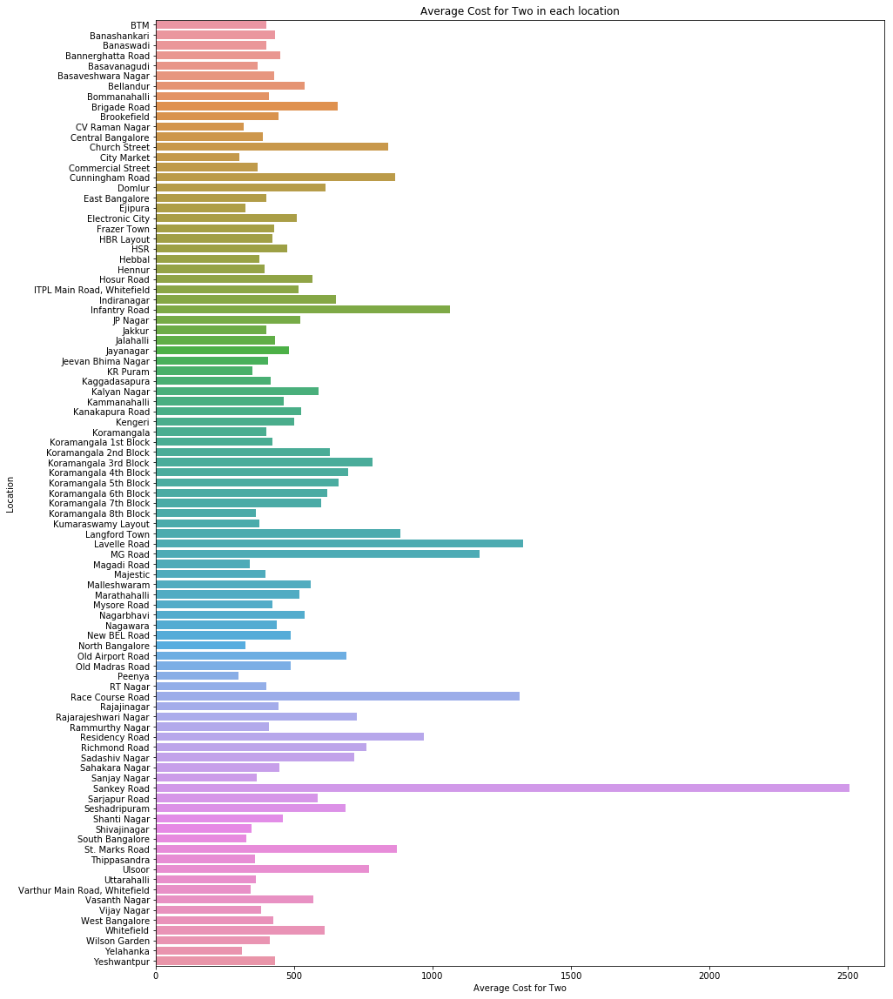

In [80]:
#we can use barplot to show average 
plt.figure(figsize=(15,20))
ax=sns.barplot(y=zomato_avg_loc.index,x='cost_for_two',data=zomato_avg_loc)

plt.xlabel("Average Cost for Two")
plt.ylabel("Location")
plt.title("Average Cost for Two in each location")


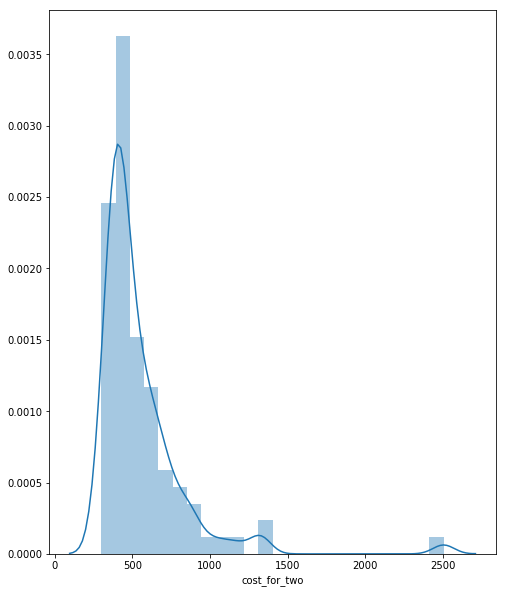

In [88]:
#let's see price distribution in these cities
sns.distplot(zomato_avg_loc['cost_for_two'],kde=True)

In [82]:
#boxplot to show the outliers
fig=px.box(zomato_df,x='location',y='cost_for_two',hover_data=['location','name','cost_for_two'],height=800,width=1500)
fig.show()



In [83]:
#correlattion between votes and cost for two

zomato_df[['votes','rate','cost_for_two']].corr()

,votes,rate,cost_for_two
votes,1.000000,0.428659,0.381451
rate,0.428659,1.000000,0.370062
cost_for_two,0.381451,0.370062,1.000000


In [36]:
i=0
for item in zomato_df.cuisines:
    print(str(i)+".")
    if ", " in item:
        print(item.split(', '))
    else:
        print(item)
    i+=1

0.
['North Indian', 'Mughlai', 'Chinese']
1.
['Chinese', 'North Indian', 'Thai']
2.
['Cafe', 'Mexican', 'Italian']
3.
['South Indian', 'North Indian']
4.
['North Indian', 'Rajasthani']
5.
North Indian
6.
['North Indian', 'South Indian', 'Andhra', 'Chinese']
7.
['Pizza', 'Cafe', 'Italian']
8.
['Cafe', 'Italian', 'Continental']
9.
['Cafe', 'Mexican', 'Italian', 'Momos', 'Beverages']
10.
Cafe
11.
['Cafe', 'Italian', 'Continental']
12.
['Cafe', 'Chinese', 'Continental', 'Italian']
13.
['Cafe', 'Continental']
14.
['Cafe', 'Mexican', 'Italian']
15.
Cafe
16.
['Cafe', 'Fast Food', 'Continental', 'Chinese', 'Momos']
17.
['Chinese', 'Cafe', 'Italian']
18.
['Cafe', 'Italian', 'American']
19.
['Cafe', 'Chinese', 'Continental', 'Italian']
20.
['Cafe', 'French', 'North Indian']
21.
['Cafe', 'Pizza', 'Fast Food', 'Beverages']
22.
['Cafe', 'Fast Food']
23.
['Italian', 'Fast Food', 'Cafe', 'European']
24.
Cafe
25.
['Cafe', 'Bakery']
26.
['Cafe', 'South Indian']
27.
['Cafe', 'Fast Food', 'Beverages']
28

TypeError: argument of type 'float' is not iterable

In [ ]:
zomato_df.iloc[435:441,:]

In [ ]:
dictionary={"A":1,"B":2,"c":3,"d":4}

In [ ]:
dictionary